# This notebook sets an absorption line, which we will reproduce with forward modeling

Simple proof of concept modeling.

We want to predict the metallicity of a system by assuming that gas is distributed along all of line of sight assuming some radial profile. And from that teasing out the metallicity.

Written By:  Rongmon Bordoloi
             Feb 22, 2019

Tested on: Python 3.7



In [1]:
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
from importlib import reload

from rbvfit import model as m
reload(m)

import emcee
import corner
import scipy.optimize as op
import sys

width = 30    # for plotting formatting...

# Make a first, basic, single component test profile

(0.0, 1.2)

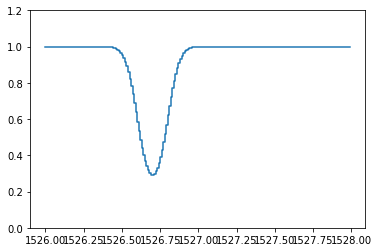

In [2]:
wave=np.arange(1526.,1528.,0.01)
n_clouds = 1
logN=np.array([14.])
b=np.array([20.])
v=np.array([0.])

zabs     = np.zeros((n_clouds))
lambda_rest = 1526.9 * np.ones((n_clouds))

s=m.create_voigt(zabs,lambda_rest)
theta=np.concatenate((logN,b,v))
outflux= s.model_flux(theta,wave)

orig_values = np.array([ logN, b, v ])

# Add error
fnorm= outflux #+ np.random.normal(0., .02, len(wave))
enorm= 0.02 * np.ones((len(wave),))

plt.step(wave,fnorm)
plt.ylim([0.,1.2])

# Setup Model for line properties

In [3]:
#los=np.arange(-100.,100.,1)
def estimate_parameter_single_cell(log_rho, log_los_cm, log_solar, log_f_c, vel_p, log_temp):
    # Convert the number density to actual ion number density 
    # Set metallicity
    O_H_Solar    = 10.**(-3.31);
    C_H_Solar    = 10.**(-3.61);
    Ne_H_Solar   = 10.**(-4.00);
    N_H_Solar    = 10.**(-4.07);
    Si_H_Solar   = 10.**(-4.46);
    Mg_H_Solar   = 10.**(-4.46);
    
    KBOLTZMANN = 1.3806488e-16;
    
    # Atomic Mass unit, grams.
    AMU          = 1.6605388*10.**(-24.);
    kmpsToCmps   = 1.0*10.**(5.);
    oxygenMass   = 15.999 * AMU;
    carbonMass   =  6.000 * AMU;
    neonMass     = 10.000 * AMU;
    nitrogenMass = 7.000 * AMU;
    silliconMass = 14.00 * AMU;
    magnesiumMass= 12.00 *AMU; 
    
    X_mass= silliconMass
    X_H_Solar= Si_H_Solar

    # Compute b assuming it is thermal at temperature Temp
    b = np.ones_like(log_rho)*(1.0*10.**(-5.)*np.sqrt(2.0 *KBOLTZMANN * 10.0**log_temp / X_mass))

    metallicity = 10.0**(log_solar)*X_H_Solar
    
    # Set ionization fraction, total column density, and log column density
    rho_ion= (10.0**(log_rho) * metallicity * 10.0**(log_f_c) )
    rho_ion= rho_ion + 1e-99   
    col_per_cell=rho_ion*10.0**(log_los_cm)
    logN=np.log10(col_per_cell)
    
    return np.array(logN), np.array(b), np.array(vel_p)



def model_guess(beta,wave):
    log_rho    = np.array([beta[0]])
    log_los_cm = np.array([beta[1]])
    log_solar  = np.array([beta[2]])
    log_f_c    = np.array([beta[3]])
    vel_p      = np.array([beta[4]])
    log_temp   = np.array([beta[5]])
    
   # Temp = 10.0**log_temp    #3e4 # Fixed
        
    logN, b, vel_p= estimate_parameter_single_cell(log_rho, log_los_cm, log_solar, log_f_c, vel_p, log_temp)
    theta  = np.concatenate((logN,b,vel_p))
    outflux= s.model_flux(theta,wave)
    
    return outflux

In [4]:
def print_and_plot_results(sampler, wave, flux):
    samples=sampler.chain[:, np.rint(no_of_steps/5).astype(np.int):, :].reshape((-1, ndim))#sampler.flatchain
    st=np.median(samples,axis=0)#np.median(sampler.flatchain, axis=0)
    theta_prime=st[:]

    #print("Input values were  (logN,b,v): ({:8.4f}, {:8.4f}, {:8.4f})".format(orig_values.flatten()[0], orig_values.flatten()[1], orig_values.flatten()[2]))
    derived_values = [estimate_parameter_single_cell(*theta_prime)[ijk] for ijk in range(3)]
    print("Derived values are (logN,b,v): ({:8.4f}, {:8.4f}, {:8.4f})".format(derived_values[0],derived_values[1],derived_values[2]))

    best_fit = model_guess(theta_prime,wave)

    plt.step(wave,flux, label='Target Signal')
    plt.plot(wave,best_fit,color='k',linewidth=1,label='mcmc')
    plt.legend()
    plt.ylim([0.,1.2])
    
    return best_fit
    
def make_corner_plots(sampler):
    samples=sampler.chain[:, 100:, :].reshape((-1, ndim))#sampler.flatchain
    st=np.median(samples,axis=0)#np.median(sampler.flatchain, axis=0)
    figure=corner.corner(samples, labels=text_label, truths=st)
    theta_prime=st

    value1 =np.percentile(samples,32,axis=0)
    value2 = np.percentile(samples,68,axis=0)    
    axes = np.array(figure.axes).reshape((ndim, ndim))

    # Loop over the diagonal
    for i in range(ndim):
        ax = axes[i, i]
        ax.axvline(value1[i], color="aqua")
        ax.axvline(value2[i], color="aqua")

    # Loop over the histograms
    for yi in range(ndim):
        for xi in range(yi):
            ax = axes[yi, xi]
            ax.axvline(value1[xi],color="aqua")
            ax.axvline(value2[xi],color="aqua")
            #ax.axhline(value1[yi], color="g")
            #ax.axhline(value2[yi], color="r")
            #ax.plot(value1[xi], value1[yi], "sg")
            #ax.plot(value2[xi], value2[yi], "sr")
        

# Make a random first guess; Compare with target; bad fit.

12.749555225133086 5.969372813963787 0.0


(0.0, 1.2)

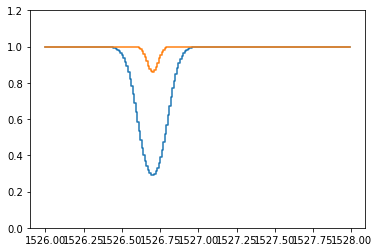

In [19]:
rho = 1e-4           # a semi-typical CGM density
loc_cm = 3.086e+21   # a kpc
solar =1.05
f_c = 0.5
vel_const = 0.
Temp= 3e4

logN_guess, b_guess, vel_p_guess= estimate_parameter_single_cell(np.log10(rho), np.log10(loc_cm), np.log10(solar), np.log10(f_c), vel_const, np.log10(Temp))
    
print(logN_guess, b_guess, vel_p_guess)

theta=np.concatenate(([logN_guess],[b_guess],[vel_p_guess]))
outflux_guess= s.model_flux(theta,wave)

# Add error
fnorm_guess= outflux_guess #+ np.random.normal(0., .02, len(wave))
enorm_guess= 0.02 * np.ones((len(wave),))

plt.step(wave,fnorm)
plt.step(wave,fnorm_guess)
plt.ylim([0.,1.2])

# Setup Likelihoods
And define choices about how many chains and steps will be taken for the MCMC operations

In [29]:
perturbation=1e-1
no_of_Chain=50
no_of_steps=1500

text_label=['rho', 'len', 'solar', 'f_c', 'vel_const', 'temp', 'lnf']
#lb   = [-10, 10, -4, -1, -500., 1, -np.inf]
#ub   = [2  , 25,  1,  0,  500., 9,  0.0   ]

lb   = [-10, 10, -4, -1, -500., 1 ]
ub   = [2  , 25,  1,  0,  500., 9 ]

length_of_lb = len(lb)
ndim, nwalkers = length_of_lb, no_of_Chain

######## Computing Likelihoods######
def lnprior(theta, lb, ub):
    for index in range(0, len(lb)):
        if (lb[index] > theta[index]) or (ub[index] < theta[index]):
            print("Prior Violation! for index {:d} with value {:16.8f} (lb and ub are {:16.8f}/{:16.8f})".format(
                        index, theta[index], lb[index], ub[index]))
            return -np.inf
#            break
    return 0.0

def lnlike(theta, model, x, y, yerr):
    model_y = model(theta, x)
    inv_sigma2 = 1.0/(yerr**2 )
    all_c2_values = (y - model_y) ** 2 * inv_sigma2  - np.log(inv_sigma2)
    #print("min/max of yerr = {:16.8f}/{:16.8f}".format(np.min(yerr),np.max(yerr) ) )
    print("min/max of np.log(inv_sigma2) = {:16.8f}/{:16.8f}  sum(all_c2_values) = {:16.8f}".format(
        np.min(np.log(inv_sigma2)), np.max(np.log(inv_sigma2)), np.sum( all_c2_values  )  ) )
    return -0.5 * (np.sum( all_c2_values  )) 

def lnprob(theta, lb, ub, model, x, y, yerr):
    lp = lnprior(theta, lb, ub)
    if not np.isfinite(lp):
        return -np.inf
    return lp + lnlike(theta, model, x, y, yerr)

def optimize_guess(model, theta, lb, ub, x, y, yerr):
    nll = lambda *args: -lnprob(*args)
    result = op.minimize(nll, [theta], args=(lb, ub, model, x, y, yerr))
    p = result["x"]
    return p



def old_complicated_lnlike(theta, model, x, y, yerr):
    model_y = model(theta, x)
    wave_min = x[  np.argmin(model_y) ]    # wavelength asssociated with line minimum
    wave_off = np.abs( x - wave_min )      # wavelength offset from peak line strength 
    mod_y = (-1.0*(model_y - 1.0) )
    mod_y = np.abs( mod_y / np.max(mod_y) - 0.5 )  
    wave_half_max = x[ np.argmin(mod_y) ]
    fwhm = np.max(  [1.0, 2.0*np.abs(wave_min - wave_half_max)]  )
    cull_index = (wave_off < fwhm*3.0)
    #yerr_mod = yerr * 10.0**(wave_off/(1.0*fwhm))
    yerr_mod = yerr
#    yerr_mod[cull_index] = np.max(yerr_mod)*10.0
#    inv_sigma2 = 1.0 / (yerr ** 2)
#    inv_sigma2 = 1.0/(yerr_mod**2 + model_y**2*np.exp(2*theta[-1])*0 )
    inv_sigma2 = 1.0/(yerr_mod**2 )

#    print(theta)
#    print("Min/Max of model_y is {:8.4f}/{:8.4f}".format(np.min(model_y),np.max(model_y)))
    all_c2_values = (y - model_y) ** 2 * inv_sigma2  #- np.log(inv_sigma2)
#    print("Min/Max of chi-squared values are {:8.4f}/{:8.4f}".format(np.min(all_c2_values),np.max(all_c2_values)))
#    print("lnlike returned value is {:16.8f}".format( -0.5 * (np.sum( all_c2_values  ))) )
    return -0.5 * (np.sum( all_c2_values[cull_index]  ))

Current Starting Position
13.749555225133086 18.876814294814142 0.0
Input values were (logN,b,v):
[14. 20.  0.]
Optimizing Guess ***********
[0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 0

min/max of np.log(inv_sigma2) =       7.82404601/      7.82404601  sum(all_c2_values) =   -1564.80920217
min/max of np.log(inv_sigma2) =       7.82404601/      7.82404601  sum(all_c2_values) =   -1564.80920217
min/max of np.log(inv_sigma2) =       7.82404601/      7.82404601  sum(all_c2_values) =   -1564.80920217
min/max of np.log(inv_sigma2) =       7.82404601/      7.82404601  sum(all_c2_values) =   -1564.80920217
min/max of np.log(inv_sigma2) =       7.82404601/      7.82404601  sum(all_c2_values) =   -1564.80920217
min/max of np.log(inv_sigma2) =       7.82404601/      7.82404601  sum(all_c2_values) =   -1564.80920217
min/max of np.log(inv_sigma2) =       7.82404601/      7.82404601  sum(all_c2_values) =   -1564.80920217
min/max of np.log(inv_sigma2) =       7.82404601/      7.82404601  sum(all_c2_values) =   -1564.80920217
min/max of np.log(inv_sigma2) =       7.82404601/      7.82404601  sum(all_c2_values) =   -1564.80920217
min/max of np.log(inv_sigma2) =       7.82404601/      

min/max of np.log(inv_sigma2) =       7.82404601/      7.82404601  sum(all_c2_values) =   -1564.80920217
min/max of np.log(inv_sigma2) =       7.82404601/      7.82404601  sum(all_c2_values) =   -1564.80920217
min/max of np.log(inv_sigma2) =       7.82404601/      7.82404601  sum(all_c2_values) =   -1564.80920217
min/max of np.log(inv_sigma2) =       7.82404601/      7.82404601  sum(all_c2_values) =   -1564.80920217
min/max of np.log(inv_sigma2) =       7.82404601/      7.82404601  sum(all_c2_values) =   -1564.80920217
min/max of np.log(inv_sigma2) =       7.82404601/      7.82404601  sum(all_c2_values) =   -1564.80920217
min/max of np.log(inv_sigma2) =       7.82404601/      7.82404601  sum(all_c2_values) =   -1564.80920217
min/max of np.log(inv_sigma2) =       7.82404601/      7.82404601  sum(all_c2_values) =   -1564.80920217
min/max of np.log(inv_sigma2) =       7.82404601/      7.82404601  sum(all_c2_values) =   -1564.80920217
min/max of np.log(inv_sigma2) =       7.82404601/      

min/max of np.log(inv_sigma2) =       7.82404601/      7.82404601  sum(all_c2_values) =   -1564.80920217
min/max of np.log(inv_sigma2) =       7.82404601/      7.82404601  sum(all_c2_values) =   -1564.80920217
min/max of np.log(inv_sigma2) =       7.82404601/      7.82404601  sum(all_c2_values) =   -1564.80920217
min/max of np.log(inv_sigma2) =       7.82404601/      7.82404601  sum(all_c2_values) =   -1564.80920217
min/max of np.log(inv_sigma2) =       7.82404601/      7.82404601  sum(all_c2_values) =   -1564.80920217
min/max of np.log(inv_sigma2) =       7.82404601/      7.82404601  sum(all_c2_values) =   -1564.80920217
min/max of np.log(inv_sigma2) =       7.82404601/      7.82404601  sum(all_c2_values) =   -1564.80920217
min/max of np.log(inv_sigma2) =       7.82404601/      7.82404601  sum(all_c2_values) =   -1564.80920217
min/max of np.log(inv_sigma2) =       7.82404601/      7.82404601  sum(all_c2_values) =   -1564.80920217
min/max of np.log(inv_sigma2) =       7.82404601/      

(0.0, 1.2)

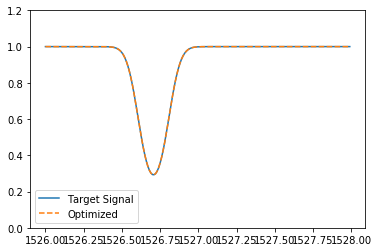

In [30]:
rho    = 1e-3           # a semi-typical CGM density
loc_cm = 3.086e+21      # a kpc
solar  =1.05
f_c    = 0.5
vel_const = 0.
temp   =3e5
initial_beta_guess = [np.log10(rho), np.log10(loc_cm), np.log10(solar), np.log10(f_c), vel_const, np.log10(temp)]    #,  1e-5]


beta = initial_beta_guess
logN_, b_, vel_p_= estimate_parameter_single_cell(beta[0], beta[1], beta[2], beta[3], beta[4], beta[5])

print("Current Starting Position")
print(logN_, b_, vel_p_)
print("Input values were (logN,b,v):")
print(orig_values.flatten())

print('Optimizing Guess ***********')

print(enorm)
print(np.min(enorm), np.max(enorm) )

popt = optimize_guess(model_guess, beta, lb, ub, wave, fnorm, enorm)
print(popt)

outflux_opt_guess= model_guess( popt, wave)

# Add error
fnorm_opt_guess= outflux_opt_guess #+ np.random.normal(0., .02, len(wave))
enorm_opt_guess= 0.02 * np.ones((len(wave),))

plt.plot(wave,fnorm, label='Target Signal')
plt.plot(wave,fnorm_opt_guess, ls='--', label='Optimized')
plt.legend()
plt.ylim([0.,1.2])

In [34]:
perturbation=1e-6
no_of_Chain=50
no_of_steps=1000

text_label=['rho', 'len', 'solar', 'f_c', 'vel_const', 'temp']
lb        = [-10, 10, 0.00, -1.00, -500., 1 ]
ub        = [2  , 25, 0.01, -1.01,  500., 9  ]

length_of_lb = len(lb)
ndim, nwalkers = length_of_lb, no_of_Chain## Do the first MCMC operation.

Starting emcee ***********
Start Burntime Calculations ***********
Prior Violation! for index 2 with value       0.08380212 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380025 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379916 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380105 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379963 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380124 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379716 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380083 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380050 (lb and ub are      

/Users/paultorrey/anaconda3/envs/py37/lib/python3.7/site-packages/emcee-3.0rc2-py3.7.egg/emcee/moves/red_blue.py:97: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


Prior Violation! for index 2 with value       0.08380190 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380008 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379980 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380023 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380455 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380071 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380094 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380234 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379736 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with val

Prior Violation! for index 2 with value       0.08379918 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380056 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379828 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380082 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380124 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379959 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379917 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380395 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379670 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with val

Prior Violation! for index 2 with value       0.08380071 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379880 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380065 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379808 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379879 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379588 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379944 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380003 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379737 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with val

Prior Violation! for index 2 with value       0.08379909 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380144 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379742 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380080 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379910 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379891 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379939 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380084 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380032 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with val

Prior Violation! for index 2 with value       0.08380002 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380111 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379829 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379998 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379770 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379975 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379939 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380012 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379754 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with val

Prior Violation! for index 2 with value       0.08379882 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379953 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380112 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380067 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380084 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379911 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380024 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379930 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379914 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with val

Prior Violation! for index 2 with value       0.08380096 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379680 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380132 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379928 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380045 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379978 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379710 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380110 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380059 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with val

[                              ]Prior Violation! for index 2 with value       0.08380102 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380040 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379921 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380056 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380066 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379846 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380013 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379971 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379899 (lb and ub are       0.00000000/      0.01000000)
Prior

Prior Violation! for index 2 with value       0.08380062 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380030 (lb and ub are       0.00000000/      0.01000000)
[#                             ]Prior Violation! for index 2 with value       0.08380201 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380075 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380125 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379927 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379959 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380008 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380004 (lb and ub are       0.00000000/      0.01000000)
Prior

Prior Violation! for index 2 with value       0.08379764 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379835 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379885 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380107 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380232 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380120 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380005 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379784 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380018 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with val

Prior Violation! for index 2 with value       0.08380135 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380149 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380142 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379755 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380063 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379977 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379963 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379817 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379961 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with val

Prior Violation! for index 2 with value       0.08380114 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380002 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380133 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380175 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379981 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379958 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380019 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379719 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380113 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with val

Prior Violation! for index 2 with value       0.08380282 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380073 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379545 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380207 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380011 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379830 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380042 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380108 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379889 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with val

[#####                         ]Prior Violation! for index 2 with value       0.08380073 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380027 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379927 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380057 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380011 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379720 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380092 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380024 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380049 (lb and ub are       0.00000000/      0.01000000)
Prior

Prior Violation! for index 2 with value       0.08380183 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380041 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379902 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380065 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379691 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380028 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379810 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380083 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379968 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with val

Prior Violation! for index 2 with value       0.08380440 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380041 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379844 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380178 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380067 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380048 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380044 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380020 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379880 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with val

Prior Violation! for index 2 with value       0.08379793 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380165 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379984 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380075 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379918 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379784 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380122 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379919 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379918 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with val

Prior Violation! for index 2 with value       0.08380056 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379947 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379976 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379685 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380019 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379805 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379938 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380148 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380121 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with val

Prior Violation! for index 2 with value       0.08379993 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379781 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380103 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379837 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380125 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380127 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380256 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379998 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379990 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with val

Prior Violation! for index 2 with value       0.08380087 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380043 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380126 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380017 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379727 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380336 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380038 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380008 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380073 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with val

Prior Violation! for index 2 with value       0.08380046 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380092 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380041 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380152 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380048 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379959 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379790 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380023 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379845 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with val

Prior Violation! for index 2 with value       0.08380033 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379834 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379889 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379895 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380031 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379964 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379871 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379870 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380175 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with val

Prior Violation! for index 2 with value       0.08380189 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380134 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380147 (lb and ub are       0.00000000/      0.01000000)
[###########                   ]Prior Violation! for index 2 with value       0.08379998 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380133 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380284 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380015 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379842 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379918 (lb and ub are       0.00000000/      0.01000000)
Prior

[############                  ]Prior Violation! for index 2 with value       0.08380098 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379981 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379997 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379497 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379889 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379952 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380015 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379965 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379945 (lb and ub are       0.00000000/      0.01000000)
Prior

[#############                 ]Prior Violation! for index 2 with value       0.08380179 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380062 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379913 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380123 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379719 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380092 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379932 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379983 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380011 (lb and ub are       0.00000000/      0.01000000)
Prior

[#############                 ]Prior Violation! for index 2 with value       0.08380299 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380012 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380131 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380069 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380026 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379924 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380022 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380058 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379976 (lb and ub are       0.00000000/      0.01000000)
Prior

Prior Violation! for index 2 with value       0.08380181 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379933 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380105 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379841 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380007 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379985 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379975 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380005 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379894 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with val

[###############               ]Prior Violation! for index 2 with value       0.08380159 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380315 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380052 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380037 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379918 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379921 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379956 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380129 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379942 (lb and ub are       0.00000000/      0.01000000)
Prior

Prior Violation! for index 2 with value       0.08380091 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379852 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380128 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379943 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379927 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379762 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379977 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379669 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380065 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with val

Prior Violation! for index 2 with value       0.08379536 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380046 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379786 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380093 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380201 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379991 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380046 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380014 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380093 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with val

[#################             ]Prior Violation! for index 2 with value       0.08380004 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379952 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380133 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380073 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379890 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380041 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379919 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379931 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380163 (lb and ub are       0.00000000/      0.01000000)
Prior

[##################            ]Prior Violation! for index 2 with value       0.08380443 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380030 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380088 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379942 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380109 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380074 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380007 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379827 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380085 (lb and ub are       0.00000000/      0.01000000)
Prior

[###################           ]Prior Violation! for index 2 with value       0.08380340 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380024 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379780 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380028 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379927 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379957 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380038 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379772 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379847 (lb and ub are       0.00000000/      0.01000000)
Prior

[####################          ]Prior Violation! for index 2 with value       0.08379432 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379866 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379930 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380043 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380018 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379842 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379952 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380210 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379909 (lb and ub are       0.00000000/      0.01000000)
Prior

[#####################         ]Prior Violation! for index 2 with value       0.08380383 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380040 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379913 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380311 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379957 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380250 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380127 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380077 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379910 (lb and ub are       0.00000000/      0.01000000)
Prior

Prior Violation! for index 2 with value       0.08380170 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380001 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380033 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380510 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380045 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379943 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379968 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380100 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380053 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with val

Prior Violation! for index 2 with value       0.08380029 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379875 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380051 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379905 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379924 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379925 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380038 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380251 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380148 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with val

Prior Violation! for index 2 with value       0.08380166 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380027 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380052 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379906 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379648 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379889 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379934 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380002 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379969 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with val

[########################      ]Prior Violation! for index 2 with value       0.08380029 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379953 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380069 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379785 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380122 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380001 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379726 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379774 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380060 (lb and ub are       0.00000000/      0.01000000)
Prior

[########################      ]Prior Violation! for index 2 with value       0.08380047 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379655 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380082 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380062 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379980 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379979 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379846 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380059 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379978 (lb and ub are       0.00000000/      0.01000000)
Prior

Prior Violation! for index 2 with value       0.08379899 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379913 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379861 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379995 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379976 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380155 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380074 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380238 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380032 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with val

Prior Violation! for index 2 with value       0.08380140 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379856 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379936 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380140 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379410 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380006 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380063 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379939 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379621 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with val

[###########################   ]Prior Violation! for index 2 with value       0.08380069 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380078 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379939 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380005 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379760 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380069 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380051 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379921 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379960 (lb and ub are       0.00000000/      0.01000000)
Prior

[############################  ]Prior Violation! for index 2 with value       0.08380093 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380015 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379818 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380078 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379596 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380022 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379834 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379814 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380030 (lb and ub are       0.00000000/      0.01000000)
Prior

Prior Violation! for index 2 with value       0.08379986 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380041 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379960 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379832 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380163 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380221 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380178 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380000 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380066 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with val

Prior Violation! for index 2 with value       0.08379911 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380057 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379513 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380183 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379979 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379991 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379727 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380068 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379972 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with val

Prior Violation! for index 2 with value       0.08380133 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380086 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380052 (lb and ub are       0.00000000/      0.01000000)
[##############################]Prior Violation! for index 2 with value       0.08380226 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380025 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379915 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380019 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08380132 (lb and ub are       0.00000000/      0.01000000)
Prior Violation! for index 2 with value       0.08379523 (lb and ub are       0.00000000/      0.01000000)
Prior

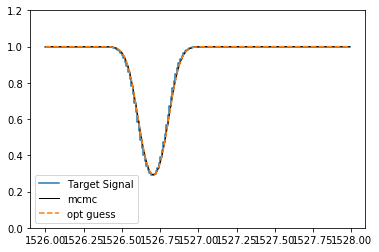

In [35]:
guesses = [popt + perturbation * np.random.randn(ndim) for i in range(nwalkers)]
print("Starting emcee ***********")
burntime = np.round(no_of_steps * .2)
sampler = emcee.EnsembleSampler(nwalkers, ndim, lnprob, threads=1, args=(lb, ub, model_guess, wave, fnorm, enorm))
print("Start Burntime Calculations ***********")

pos, prob, state = sampler.run_mcmc(guesses, burntime)  #First Burning some steps
sampler.reset()

print("Done Burning Steps! Now starting the Final Calculations:")
print("*****************")
for i, result in enumerate(sampler.sample(pos, iterations=no_of_steps)):
    n = int((width+1) * float(i) / no_of_steps)
    sys.stdout.write("\r[{0}{1}]".format('#' * n, ' ' * (width - n)))
sys.stdout.write("\n")

best_fit = print_and_plot_results(sampler, wave, fnorm)
plt.plot(wave,fnorm_opt_guess,label='opt guess', ls='--')
plt.legend()

In [32]:
samples=sampler.chain[:, np.rint(no_of_steps/5).astype(np.int):, :].reshape((-1, ndim))#sampler.flatchain
st=np.median(samples,axis=0)#np.median(sampler.flatchain, axis=0)
print(st)
print(lnlike(st, model_guess, wave, fnorm, enorm))

[-1.30617437e+00  2.17184921e+01 -9.17815130e-01 -5.22180825e-01
  6.54221899e-03  5.52686574e+00]
min/max of np.log(inv_sigma2) =       7.82404601/      7.82404601  sum(all_c2_values) =    7080.94819019
-3540.4740950937808


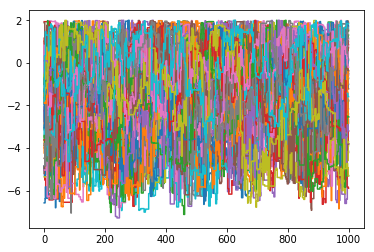

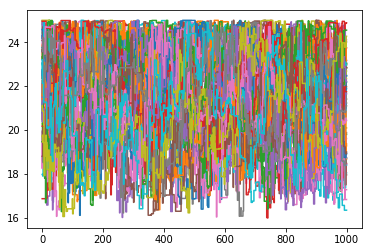

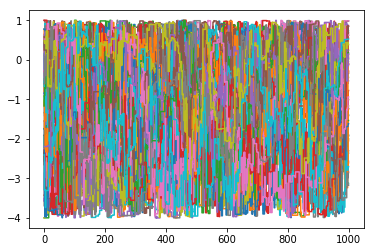

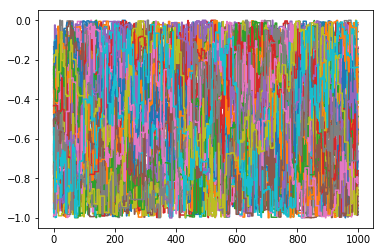

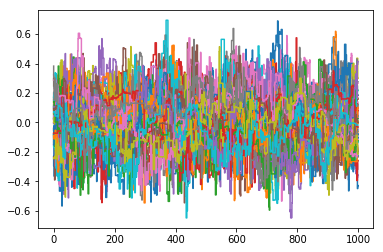

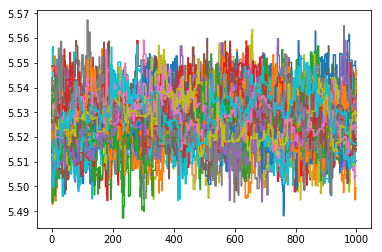

In [329]:
samples = sampler.chain[:, :, :].reshape((-1, ndim))
sampler_ = np.array( sampler.chain )

for this_dim in range(sampler_.shape[2]):   # number of parameters
    for walker_nr in range(sampler_.shape[0]):
        plt.step(range(sampler_.shape[1]), sampler_[walker_nr,:,this_dim])
    plt.show()

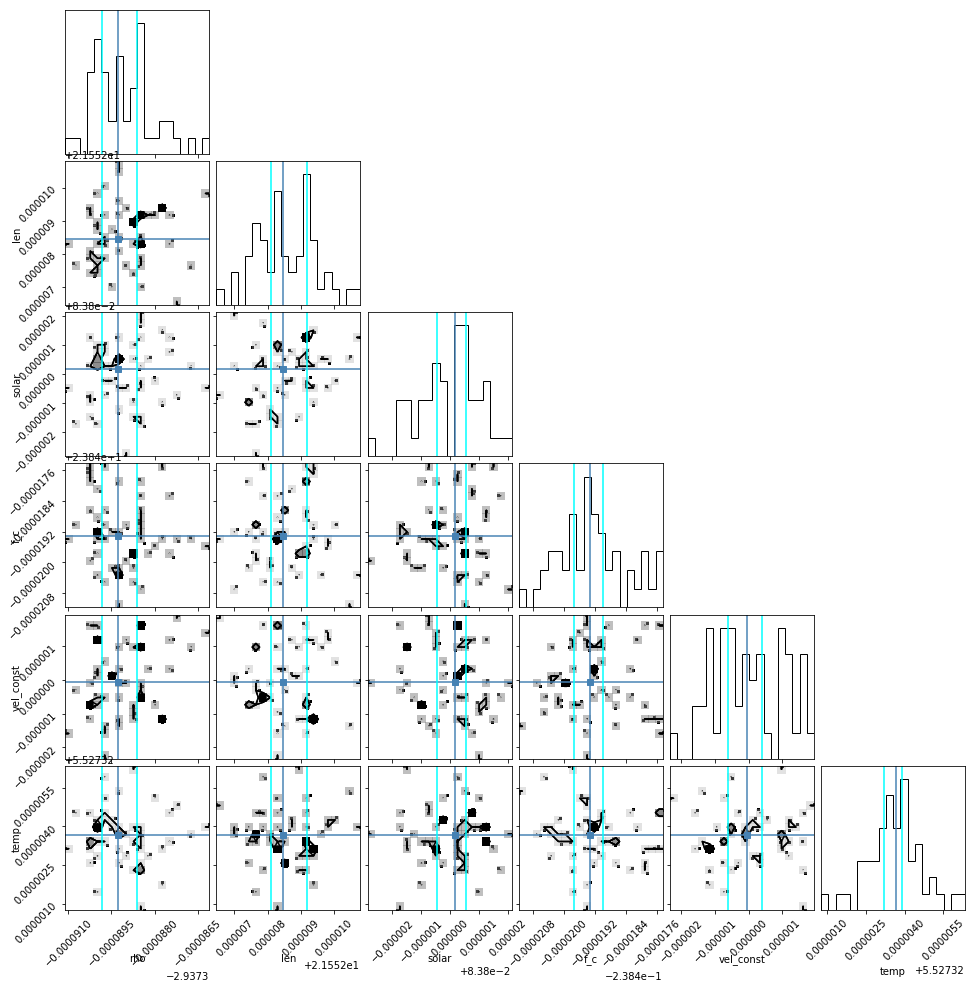

In [36]:
make_corner_plots(sampler)

## Now try something just a bit more complicated.  Multiple line components.

(0.0, 1.2)

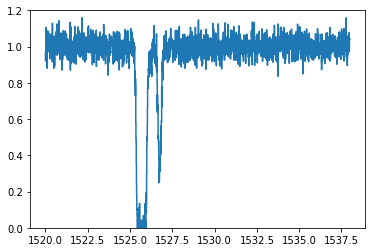

In [188]:
wave=np.arange(1520.,1538.,0.01)
# We are setting up 3 clumps at z = 0
# For SiII 1526 absorption
# With default 6.5 pixel FWHM of HST/COS and Gaussian convolution
n_clouds = 3
zabs=np.zeros((n_clouds))
lambda_rest = 1526.9 * np.ones((n_clouds))
s=m.create_voigt(zabs,lambda_rest)

#Properties of the lines (column density, dopler b, velocity)
logN=np.array([14.,13., 16.])
b=np.array([20.,21.,29.])
v=np.array([10.,-100.,-200.])
theta=np.concatenate((logN,b,v))

outflux= s.model_flux(theta,wave)
orig_values = np.array([logN, b, v])

# Add error
fnorm= outflux + np.random.normal(0., .05, len(wave))
enorm= 0.02 * np.ones((len(wave),))

plt.step(wave,fnorm)
plt.ylim([0.,1.2])

Current Starting Position (logN,b,vel_p): ( 13.7496, 18.8768,  0.0000)
Input values were (logN,b,v): ( 14.0000, 13.0000, 16.0000)
Optimizing Guess ***********
Starting emcee ***********
Start Burntime Calculations ***********
Done Burning Steps!  Now starting the Final Calculations:
[##############################]
Derived values are (logN,b,v): ( 14.5924,  20.7105,   9.8549)


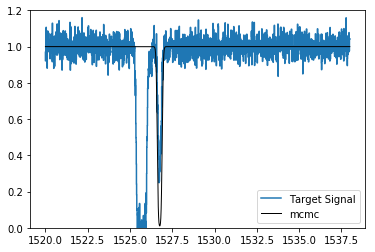

In [189]:
beta = initial_beta_guess
logN_, b_, vel_p_= estimate_parameter_single_cell(beta[0], beta[1], beta[2], beta[3], beta[4], beta[5])
print("Current Starting Position (logN,b,vel_p): ({:8.4f},{:8.4f},{:8.4f})".format(logN_,b_,vel_p_))
print("Input values were (logN,b,v): ({:8.4f},{:8.4f},{:8.4f})".format(orig_values.flatten()[0],orig_values.flatten()[1],orig_values.flatten()[2]))

print('Optimizing Guess ***********')
popt = optimize_guess(model_guess, beta, lb, ub, wave, fnorm, enorm)

######
guesses = [popt + perturbation * np.random.randn(ndim) for i in range(nwalkers)]
print("Starting emcee ***********")
burntime = np.round(no_of_steps * .2)
sampler = emcee.EnsembleSampler(nwalkers, ndim, lnprob, threads=8, args=(lb, ub, model_guess, wave, fnorm, enorm))
print("Start Burntime Calculations ***********")

pos, prob, state = sampler.run_mcmc(guesses, burntime)     #First Burning some steps
sampler.reset()

print("Done Burning Steps!  Now starting the Final Calculations:")
for i, result in enumerate(sampler.sample(pos, iterations=no_of_steps)):
    n = int((width+1) * float(i) / no_of_steps)
    sys.stdout.write("\r[{0}{1}]".format('#' * n, ' ' * (width - n)))
sys.stdout.write("\n")

best_fit = print_and_plot_results(sampler, wave, fnorm)

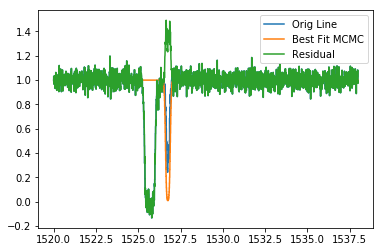

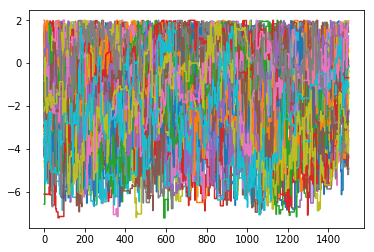

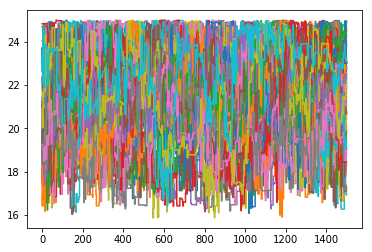

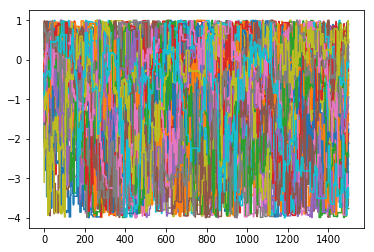

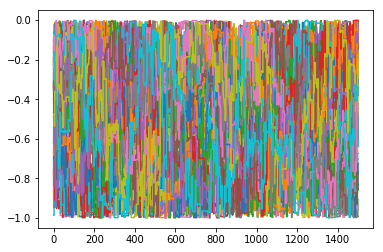

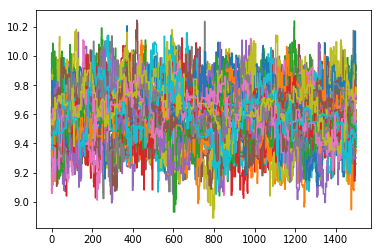

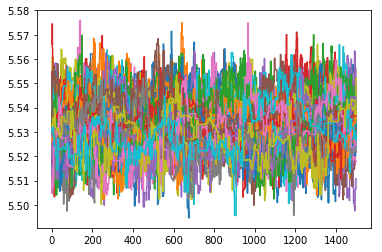

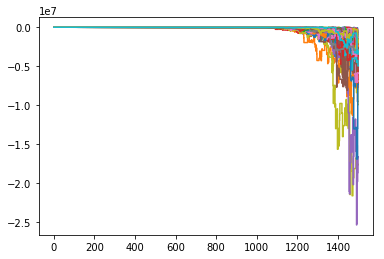

In [39]:
fnorm_2 = fnorm - best_fit + 1.0
plt.step(wave,fnorm, label='Orig Line')
plt.step(wave,best_fit, label='Best Fit MCMC')
plt.plot(wave,fnorm_2, label='Residual')
plt.legend()
plt.show()


samples = sampler.chain[:, 50:, :].reshape((-1, ndim))
sampler_ = np.array( sampler.chain )
#print(sampler.shape)

for this_dim in range(sampler_.shape[2]):   # number of parameters
    for walker_nr in range(sampler_.shape[0]):
        plt.step(range(sampler_.shape[1]), sampler_[walker_nr,:,this_dim])
    plt.show()

In [40]:
beta = initial_beta_guess
logN_, b_, vel_p_= estimate_parameter_single_cell(beta[0], beta[1], beta[2], beta[3], beta[4], beta[5])

print('Optimizing Guess ***********')
popt = optimize_guess(model_guess, beta, lb, ub, wave, fnorm_2, enorm)

guesses = [popt + perturbation * np.random.randn(ndim) for i in range(nwalkers)]
print("Starting emcee ***********")
burntime = np.round(no_of_steps * .2)
sampler = emcee.EnsembleSampler(nwalkers, ndim, lnprob, threads=8, args=(lb, ub, model_guess, wave, fnorm_2, enorm))
print("Start Burntime Calculations ***********")

pos, prob, state = sampler.run_mcmc(guesses, burntime) #First Burning some steps
sampler.reset()

print("Done Burning Steps!  Now starting the Final Calculations:")
print("*****************")
#Now Running mcmc
for i, result in enumerate(sampler.sample(pos, iterations=no_of_steps)):
    n = int((width+1) * float(i) / no_of_steps)
    sys.stdout.write("\r[{0}{1}]".format('#' * n, ' ' * (width - n)))
sys.stdout.write("\n")

Optimizing Guess ***********
Starting emcee ***********
Start Burntime Calculations ***********
Done Burning Steps!  Now starting the Final Calculations:
*****************
[##############################]


Derived values are (logN,b,v): ( 14.6720,  32.4761, -199.5442)


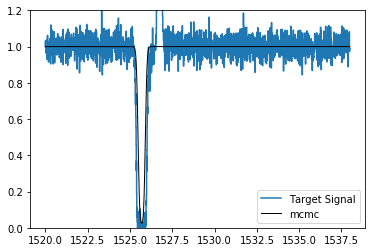

In [41]:
best_fit = print_and_plot_results(sampler, wave,fnorm_2)

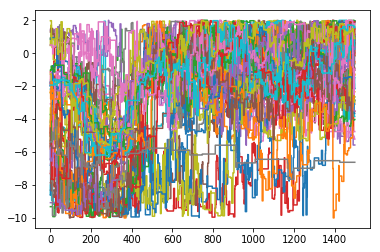

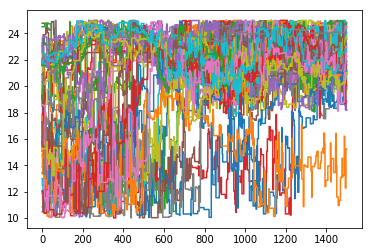

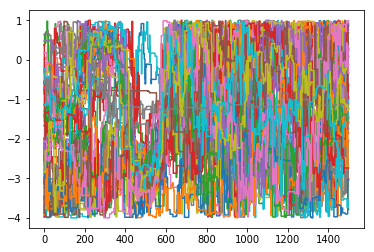

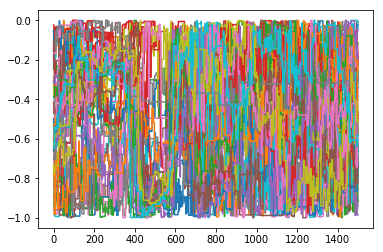

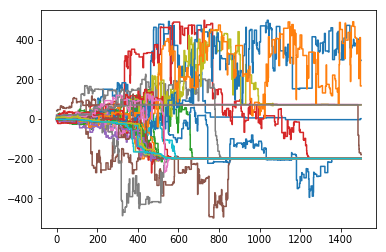

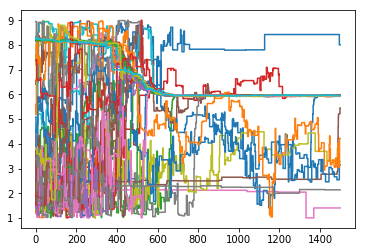

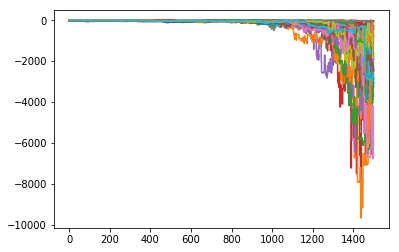

(75000, 7)


In [42]:
samples = sampler.chain[:, 0:, :].reshape((-1, ndim))
sampler_ = np.array( sampler.chain )
#print(sampler.shape)

for this_dim in range(sampler_.shape[2]):   # number of parameters
    for walker_nr in range(sampler_.shape[0]):
        plt.step(range(sampler_.shape[1]), sampler_[walker_nr,:,this_dim])
    plt.show()
    
print(samples.shape)

#make_corner_plots(sampler)

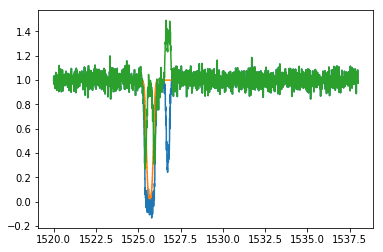

In [43]:
fnorm_3 = fnorm_2 - best_fit + 1.0
plt.step(wave,fnorm)
plt.step(wave,best_fit)
plt.plot(wave,fnorm_3)

## Now, lets try again, but in a more streamlined approach

(0.0, 1.2)

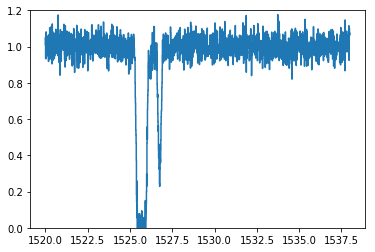

In [50]:
wave=np.arange(1520.,1538.,0.01)
# We are setting up 3 clumps at z = 0
# For SiII 1526 absorption
# With default 6.5 pixel FWHM of HST/COS and Gaussian convolution
n_clouds = 3
zabs=np.zeros((n_clouds))
lambda_rest = 1526.9 * np.ones((n_clouds))
s=m.create_voigt(zabs,lambda_rest)

#Properties of the lines (column density, dopler b, velocity)
logN=np.array([14.,13., 16.])
b=np.array([20.,21.,29.])
v=np.array([10.,-100.,-200.])
theta=np.concatenate((logN,b,v))

outflux= s.model_flux(theta,wave)
orig_values = np.array([logN, b, v])

# Add error
fnorm= outflux + np.random.normal(0., .05, len(wave))
enorm= 0.02 * np.ones((len(wave),))

plt.step(wave,fnorm)
perturbation=1e-1
no_of_Chain=100
no_of_steps=5000
plt.ylim([0.,1.2])

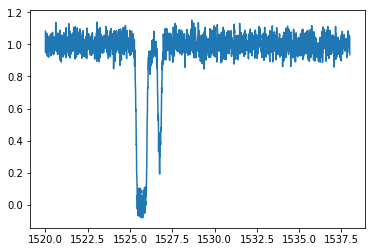

Optimizing Guess ***********


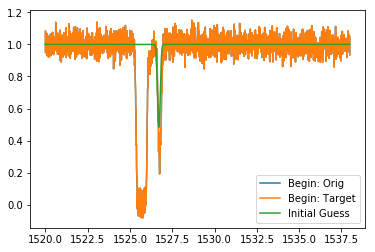

Starting emcee ***********
Start Burntime Calculations ***********
Done Burning Steps!  Now starting the Final Calculations:
[##############################]
Derived values are (logN,b,v): ( 18.1314,  21.2206, -199.9949)


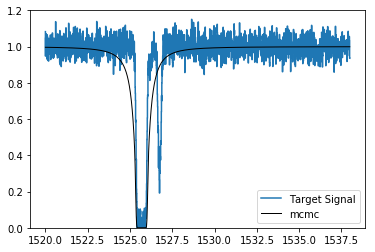

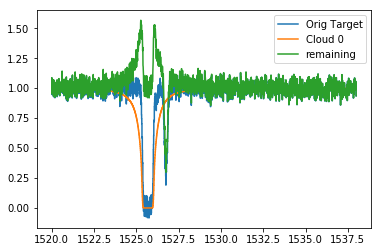

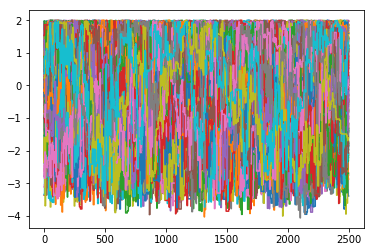

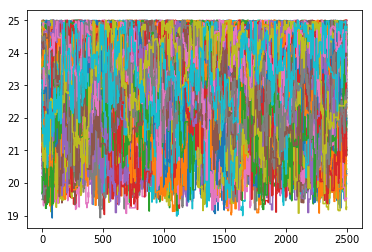

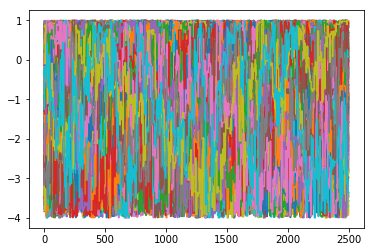

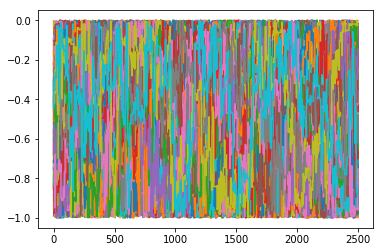

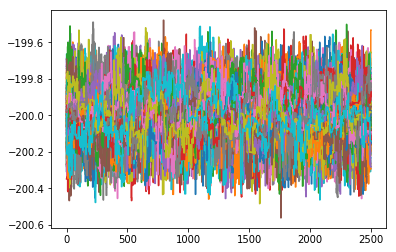

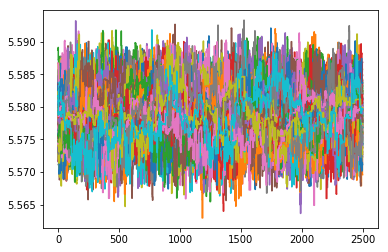

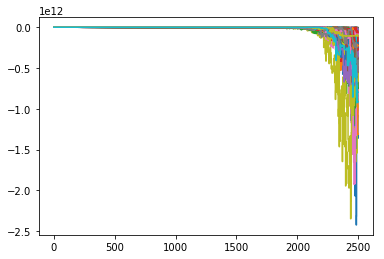

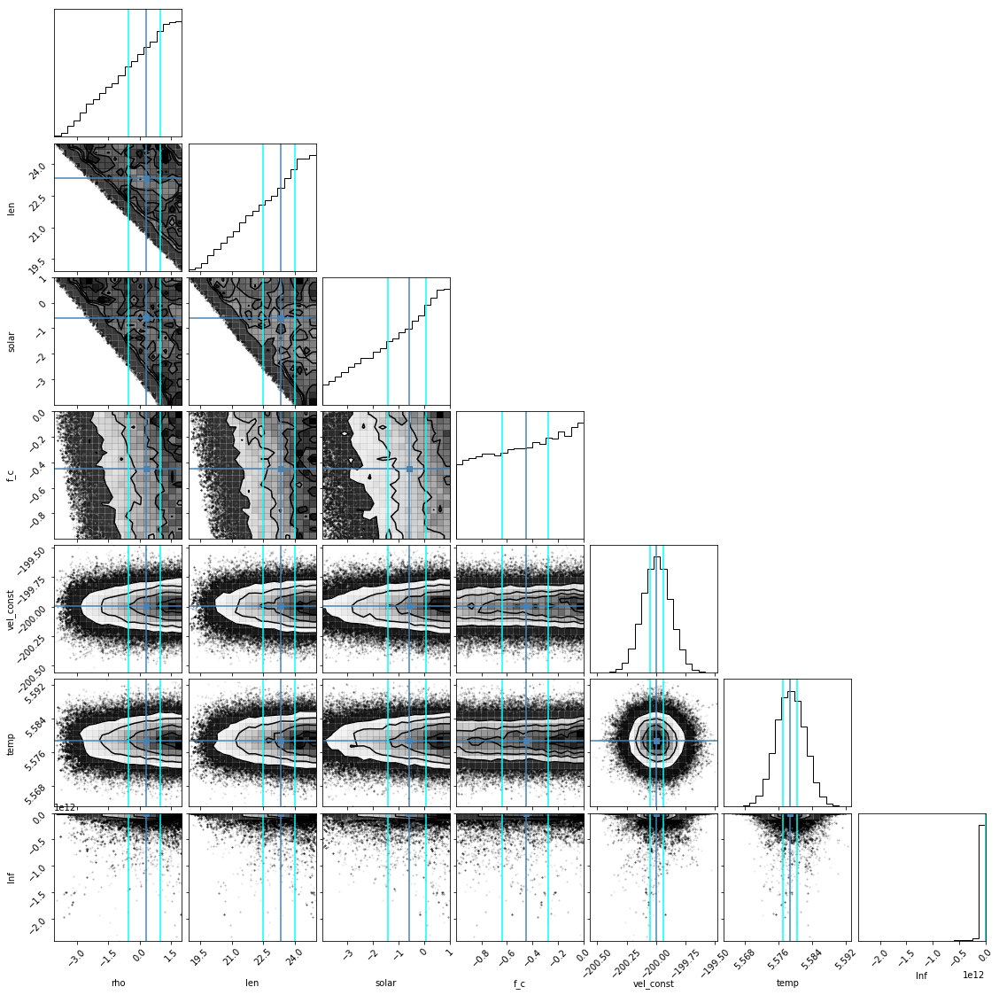

In [48]:
perturbation=1e-1
no_of_Chain=150
no_of_steps=2500
ndim, nwalkers = length_of_lb, no_of_Chain

n_clouds_in_fit = 1

plt.plot(wave,fnorm)
plt.show()

cloud_fluxes = np.ones(  (n_clouds_in_fit,fnorm.shape[0])  )

n_iterations = 1

orig_target = np.copy( fnorm )

for iteration in range(n_iterations):
    for cloud_number in range(n_clouds_in_fit):
        current_fitting_needs = np.copy( orig_target )
        for cl_nr in range(n_clouds_in_fit):
            if(cloud_number != cl_nr):
                current_fitting_needs -= (cloud_fluxes[cl_nr,:] - 1.0)
        plt.plot(wave,orig_target, label='Begin: Orig')
        plt.plot(wave,current_fitting_needs, label='Begin: Target')

        
        beta = initial_beta_guess
        logN_, b_, vel_p_= estimate_parameter_single_cell(beta[0], beta[1], beta[2], beta[3], beta[4], beta[5])

        print('Optimizing Guess ***********')
        popt = optimize_guess(model_guess, beta, lb, ub, wave, current_fitting_needs, enorm)

        plt.plot( wave, model_guess(np.array(popt[:6]), wave), label='Initial Guess' )
        plt.legend()
        plt.show()
        
        ######
        guesses = np.array( [popt + perturbation * np.random.randn(ndim) for i in range(nwalkers)] )
        #print(guesses.shape)
        guesses[:,4] = np.linspace( -500,500,nwalkers   )
        guesses[:,4] = np.linspace( -201,-199,nwalkers   )
        #print(guesses[:,4])
        
        print("Starting emcee ***********")
        burntime = np.round(no_of_steps * .2)
        sampler = emcee.EnsembleSampler(nwalkers, ndim, lnprob, threads=1, args=(lb, ub, model_guess, wave, current_fitting_needs, enorm))
        print("Start Burntime Calculations ***********")

        pos, prob, state = sampler.run_mcmc(guesses, burntime)     #First Burning some steps
        sampler.reset()

        print("Done Burning Steps!  Now starting the Final Calculations:")
        for i, result in enumerate(sampler.sample(pos, iterations=no_of_steps)):
            n = int((width+1) * float(i) / no_of_steps)
            sys.stdout.write("\r[{0}{1}]".format('#' * n, ' ' * (width - n)))
        sys.stdout.write("\n")

        cloud_fluxes[cloud_number,:] = print_and_plot_results(sampler, wave, current_fitting_needs)
        plt.show()

        plt.step(wave,orig_target,label='Orig Target')

        current_fitting_needs = np.copy( orig_target )
        for cl_nr in range(n_clouds_in_fit):
            current_fitting_needs -= (cloud_fluxes[cl_nr,:] - 1.0)
            plt.step(wave,cloud_fluxes[cl_nr,:], label="Cloud {:d}".format(cl_nr))

        plt.plot(wave,current_fitting_needs,label='remaining')
        plt.legend()
        plt.show()
        
        samples = sampler.chain[:, 0:, :].reshape((-1, ndim))
        sampler_ = np.array( sampler.chain )
        #print(sampler.shape)

        for this_dim in range(sampler_.shape[2]):   # number of parameters
            for walker_nr in range(sampler_.shape[0]):
                plt.step(range(sampler_.shape[1]), sampler_[walker_nr,:,this_dim])
            plt.show()
        
        make_corner_plots(sampler)
        plt.show()





In [175]:
def multi_component_model_guess(beta,wave,n_components=2):
    outflux = np.ones_like(wave)
    
    for this_component in range(n_components):
        log_rho    = np.array([beta[0 + this_component*7]])
        log_los_cm = np.array([beta[1 + this_component*7]])
        log_solar  = np.array([beta[2 + this_component*7]])
        log_f_c    = np.array([beta[3 + this_component*7]])
        vel_p      = np.array([beta[4 + this_component*7]])
        log_temp   = np.array([beta[5 + this_component*7]])
        lnf        = np.array([beta[6 + this_component*7]])
        
        Temp = 10.0**log_temp
        
        logN, b, vel_p= estimate_parameter_single_cell(log_rho, log_los_cm, log_solar, log_f_c, vel_p, log_temp)
        
        #print(logN,b,vel_p)

        theta  = np.concatenate((logN,b,vel_p))
        this_outflux= s.model_flux(theta,wave)
        outflux = outflux + (this_outflux - 1.0)
    
    return outflux

def print_and_plot_results_mc(sampler, wave, flux):
    samples=sampler.chain[:, np.rint(no_of_steps/5).astype(np.int):, :].reshape((-1, ndim))
    st=np.median(samples,axis=0)
    theta_prime=st[:]
    
    #print("Input values were  (logN,b,v): ({:8.4f}, {:8.4f}, {:8.4f})".format(orig_values.flatten()[0], orig_values.flatten()[1], orig_values.flatten()[2]))
    #derived_values = [estimate_parameter_single_cell(*theta_prime)[ijk] for ijk in range(3)]
    #print("Derived values are (logN,b,v): ({:8.4f}, {:8.4f}, {:8.4f})".format(derived_values[0],derived_values[1],derived_values[2]))

    best_fit = multi_component_model_guess(theta_prime,wave)
    
    theta_prime_ = np.copy(theta_prime)
    theta_prime_[:7] = 0
    best_fit2 = multi_component_model_guess(theta_prime_,wave)

    theta_prime_ = np.copy(theta_prime)
    theta_prime_[7:] = 0
    best_fit3 = multi_component_model_guess(theta_prime_,wave)
    
    plt.step(wave,flux, label='Target Signal')
    plt.plot(wave,best_fit,color='k',linewidth=1,label='mcmc')
    plt.plot(wave,best_fit2,color='r',linewidth=1,label='mcmc2')
    plt.plot(wave,best_fit3,color='g',linewidth=1,label='mcmc3')

    plt.legend()
    plt.ylim([0.,1.2])
    
    return best_fit
    
def make_corner_plots_mc(sampler):
    samples=sampler.chain[:, 100:, :].reshape((-1, ndim))
    st=np.median(samples,axis=0)
    figure=corner.corner(samples, labels=text_label, truths=st)
    theta_prime=st

    value1 = np.percentile(samples,32,axis=0)
    value2 = np.percentile(samples,68,axis=0)    
    axes   = np.array(figure.axes).reshape((ndim, ndim))

    # Loop over the diagonal
    for i in range(ndim):
        ax = axes[i, i]
        ax.axvline(value1[i], color="aqua")
        ax.axvline(value2[i], color="aqua")

    # Loop over the histograms
    for yi in range(ndim):
        for xi in range(yi):
            ax = axes[yi, xi]
            ax.axvline(value1[xi],color="aqua")
            ax.axvline(value2[xi],color="aqua")

In [177]:
perturbation=1e-1
no_of_Chain=150
no_of_steps=3000

n_components = 2


rho    = 1e-3           # a semi-typical CGM density
loc_cm = 3.086e+21      # a kpc
solar  =1.05
f_c    = 0.5
vel_const = 0.
temp   =3e5
initial_beta_guess = [np.log10(rho), np.log10(loc_cm), np.log10(solar), np.log10(f_c), vel_const, np.log10(temp),  1e-5]



beta       = np.concatenate((initial_beta_guess,initial_beta_guess))
text_label = ['rho', 'len', 'solar', 'f_c', 'vel_const', 'temp', 'lnf',
              'rho', 'len', 'solar', 'f_c', 'vel_const', 'temp', 'lnf']
lb_multi   = np.concatenate((lb,lb))
ub_multi   = np.concatenate((ub,ub))

lb_multi[6] = -10
lb_multi[13]= -10

#v=np.array([10.,-100.,-200.])

lb_multi[4] = -225
ub_multi[4] = -175

lb_multi[11]= 0
ub_multi[11]= 50


beta[6] = -1
beta[13]= -1

print("Summary of priors:")

for ijk in range(len(lb_multi)):
    if (ijk%7==0):
        print("  Cloud {:d} Summary:".format( np.rint(ijk/7).astype(np.int) ) )
    print("    {:10s} min/max = {:16.8f}  /  {:16.8f}".format(text_label[ijk], lb_multi[ijk],ub_multi[ijk])  )

length_of_lb = len(lb_multi)
ndim, nwalkers = length_of_lb, no_of_Chain

print('Optimizing Guess ***********')
popt = optimize_guess(multi_component_model_guess, beta, lb_multi, ub_multi, wave, fnorm, enorm)
#todo:  need to feed through n_components here?!?

guesses = np.array([popt + perturbation * np.random.randn(ndim) for i in range(nwalkers)])
print(guesses.shape)

guesses[:,4] = -210 + perturbation * np.random.randn(nwalkers)
guesses[:,11] = 40 + perturbation * np.random.randn(nwalkers)

print("Starting emcee ***********")
burntime = np.round(no_of_steps * .2)
sampler = emcee.EnsembleSampler(nwalkers, ndim, lnprob, threads=16,
                                args=(lb_multi, ub_multi, multi_component_model_guess, wave, fnorm, enorm))
print("Start Burntime Calculations ***********")

pos, prob, state = sampler.run_mcmc(guesses, burntime) #First Burning some steps
sampler.reset()

print("Done Burning Steps!  Now starting the Final Calculations:")
print("*****************")
#Now Running mcmc
for i, result in enumerate(sampler.sample(pos, iterations=no_of_steps)):
    n = int((width+1) * float(i) / no_of_steps)
    sys.stdout.write("\r[{0}{1}]".format('#' * n, ' ' * (width - n)))
sys.stdout.write("\n")

Summary of priors:
  Cloud 0 Summary:
    rho        min/max =     -10.00000000  /        2.00000000
    len        min/max =      10.00000000  /       25.00000000
    solar      min/max =      -4.00000000  /        1.00000000
    f_c        min/max =      -1.00000000  /        0.00000000
    vel_const  min/max =    -225.00000000  /     -175.00000000
    temp       min/max =       1.00000000  /        9.00000000
    lnf        min/max =     -10.00000000  /        0.00000000
  Cloud 1 Summary:
    rho        min/max =     -10.00000000  /        2.00000000
    len        min/max =      10.00000000  /       25.00000000
    solar      min/max =      -4.00000000  /        1.00000000
    f_c        min/max =      -1.00000000  /        0.00000000
    vel_const  min/max =       0.00000000  /       50.00000000
    temp       min/max =       1.00000000  /        9.00000000
    lnf        min/max =     -10.00000000  /        0.00000000
Optimizing Guess ***********
(150, 14)
Starting emcee *******

Best value for rho is      -0.89530894
Best value for len is      22.77821610
Best value for solar is      -0.24044810
Best value for f_c is      -0.38891604
Best value for vel_const is    -206.08200821
Best value for temp is       5.90903239
Best value for lnf is      -5.87151406



Best value for rho is      -1.55413474
Best value for len is      20.60654491
Best value for solar is      -1.03395969
Best value for f_c is      -0.55334482
Best value for vel_const is      22.94019352
Best value for temp is       5.69092150
Best value for lnf is      -3.27406947


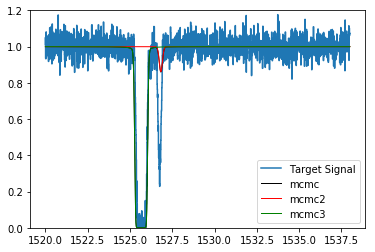

In [178]:
best_values = print_and_plot_results_mc(sampler, wave, fnorm)

samples=sampler.chain[:, 100:, :].reshape((-1, ndim))
st=np.median(samples,axis=0)


for ijk in range(len(st)):
    print("Best value for {:s} is {:16.8f}".format( text_label[ijk],st[ijk]) )
    if(ijk==6):
        print("\n\n")
    
#print(text_label) 

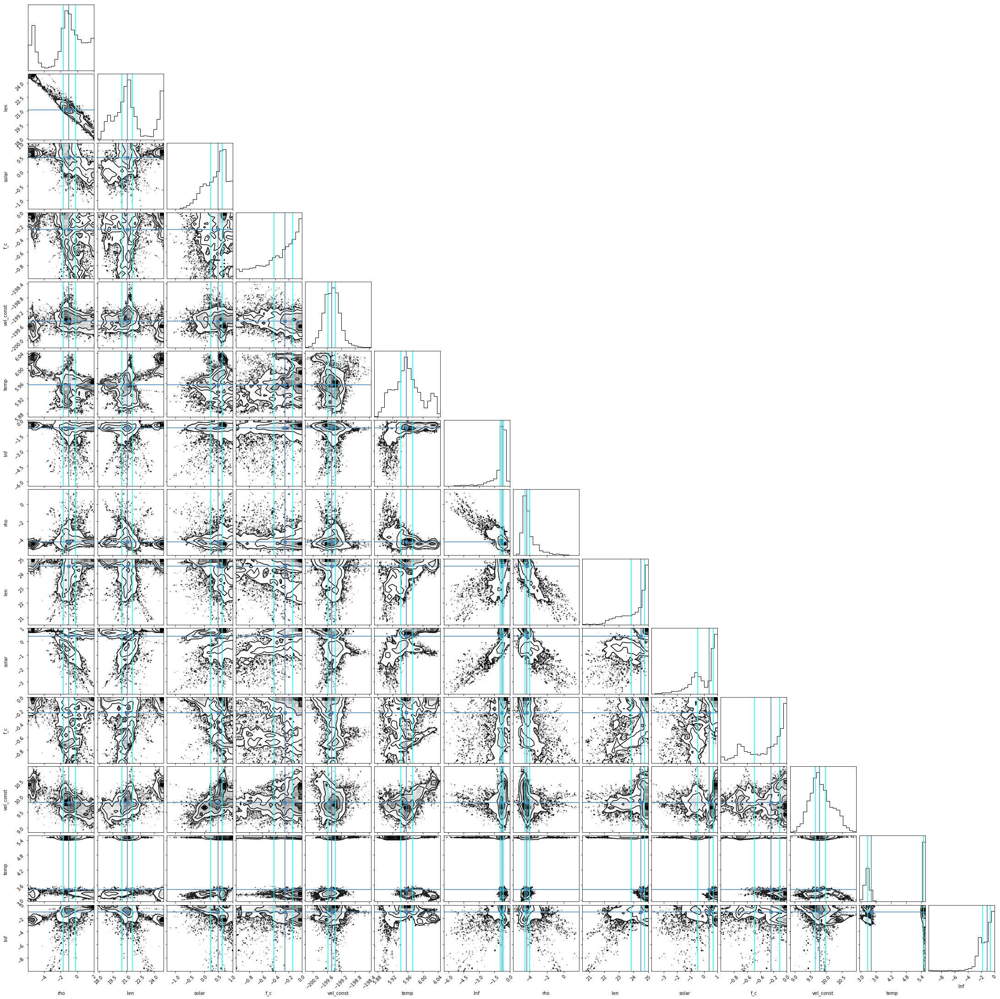

In [173]:
make_corner_plots_mc(sampler)